In [1]:
%config InlineBackend.figure_formats=['svg']
import matplotlib.pyplot as plt
import numpy as np

from src.Dataset import dataset_TES
from src.ExistingAlgorithms import max_value, area
from src.GaussianMixture import gaussian_mixture

### Area and Max value

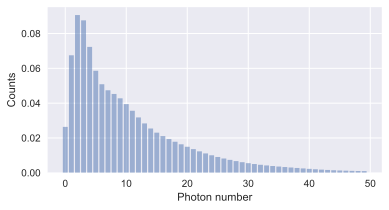

In [11]:
weights = [0.07051088775512344, 0.21031270568057314, 0.38445365365055423, 0.6780434874139336, 0.6001082447024342, 0.9999999999999999, 0.629191619746778, 1.1954682934335052e-17, 0.9999999799606453, 0.9999999999649708]

path_save = 'src/Results TES (Uniform)/Low Dimension'
path_results = 'src/Results TES (Uniform)'

data_train, data_test, expected_prob = dataset_TES(weights = weights,
                                                path_test = r'C:\Users\dalbe\Documents\Backup datasets\TES\NIST test/',
                                                path_train = r'C:\Users\dalbe\Documents\Backup datasets\TES\NIST train/',
                                                signal_size = 8192,
                                                interval = [0,350],#270],
                                                order_dB = False,
                                                normalize = True,
                                                plot_expected = True,
                                                plot_traces = False,
                                                n_photon_number = 50)

In [12]:
X_l_MAX = max_value(data_test, filter=True)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


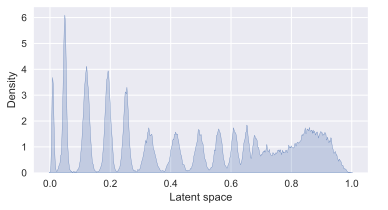

In [13]:
gm = gaussian_mixture(X_l_MAX, 
                    data_test,
                    means_init = None,
                    number_cluster = 10,
                    cluster_iter = 10,
                    info_sweep = 0,
                    plot_sweep = True,
                    width_plot = 6,
                    height_plot = 3,
                    dpi = 100)

gm.plot_density(bw_adjust = 0.03,
                plot_gaussians=False,
                plot_scale='linear')

In [14]:
X_l_AREA  = area(data_test, filter = True, plot_filter = True, threshold = 0.04, cutoff = 0.05)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


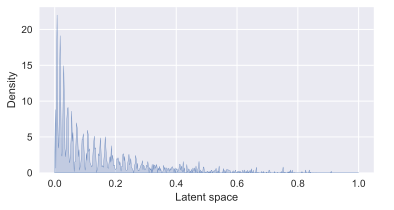

In [16]:
gm = gaussian_mixture(X_l_AREA, 
                    data_test,
                    means_init = None,
                    number_cluster = 10,
                    cluster_iter = 10,
                    info_sweep = 0,
                    plot_sweep = True,
                    width_plot = 6,
                    height_plot = 3,
                    dpi = 100)

gm.plot_density(bw_adjust = 0.001,
                plot_gaussians=False,
                plot_scale='linear')

### Example figures

In [ ]:
weights = [1]

data_train, data_test, expected_prob = dataset_TES(weights = weights,
                                                path_test = r'C:\Users\dalbe\Documents\Backup datasets\TES\NIST test/',
                                                path_train = r'C:\Users\dalbe\Documents\Backup datasets\TES\NIST train/',
                                                signal_size = 8192,
                                                interval = [0,350],#270],
                                                order_dB = False,
                                                normalize = True,
                                                plot_expected = False,
                                                plot_traces = False,
                                                n_photon_number = 50)

In [3]:
X_l_MAX = max_value(data_test, filter=True)
condition = X_l_MAX[:,0] < 1

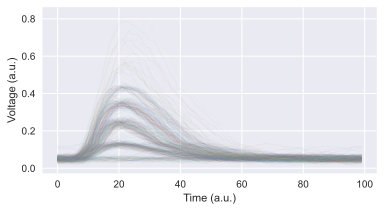

In [4]:
with plt.style.context("seaborn-v0_8"):
    plt.figure(figsize=(6,3), dpi=100)
    plt.plot(data_test.T[:,condition][:100,::20],
                alpha = 0.05,
                linewidth = 1)
    plt.xlabel('Time (a.u.)')
    plt.ylabel('Voltage (a.u.)')
    plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


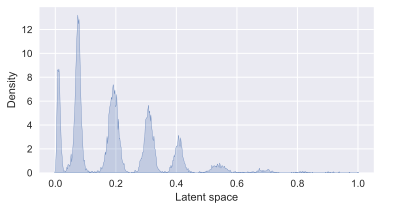

In [7]:
name_method = 'MAX'
gm = gaussian_mixture(X_l_MAX[condition], 
                    data_test[condition],
                    means_init = np.array([0,.1,.2,.3,.4,.5,.7,.8,.9,1]).reshape(-1,1),
                    number_cluster = 10,
                    cluster_iter = 10,
                    info_sweep = 0,
                    plot_sweep = True,
                    width_plot = 6,
                    height_plot = 3,
                    dpi = 100)

gm.plot_density(bw_adjust = 0.03,
                plot_gaussians=False,
                plot_scale='linear')

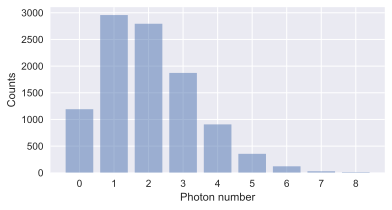

In [18]:
hist, x = np.histogram(gm.labels, bins=9)
with plt.style.context("seaborn-v0_8"):
    plt.figure(figsize=(6,3), dpi=100)
    plt.bar(x[:-1], hist, alpha = 0.5)
    plt.locator_params(nbins=10)
    plt.ylabel('Counts')
    plt.xlabel('Photon number')
    
    plt.show()